Then I think it might because of the style of content image. So I tried different type of content images.

# 1.Set environment
## Based on notebook : 
https://www.tensorflow.org/tutorials/generative/style_transfer#define_content_and_style_representations

In [1]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import tensorflow as tf
from keras import backend as K
#from keras.preprocessing.image import load_img, save_img, img_to_array
from tensorflow.keras.utils import load_img, save_img, img_to_array
from keras.applications import vgg19
from keras.models import Model
#from keras import optimizers
from scipy.optimize import fmin_l_bfgs_b
#from keras.applications.vgg19 import VGG19
#vgg19_weights = '../input/vgg19/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5'
#vgg19 = VGG19(include_top = False, weights=vgg19_weights)
from pylab import *
print(os.listdir("best-artworks-of-all-time"))
import cv2

# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

['artists.csv', 'images', 'resized']


In [2]:
import IPython.display as display
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (6,6)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

#from tensorflow.keras import layers

In [3]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

These code below for generating gif is from:
https://www.tensorflow.org/tutorials/generative/dcgan

In [4]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to c:\users\os\appdata\local\temp\pip-req-build-2g9l24ep
  Resolved https://github.com/tensorflow/docs to commit 1d5abbae9a43103db78f5b664849e863577456db
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs 'C:\Users\OS\AppData\Local\Temp\pip-req-build-2g9l24ep'


In [5]:
import imageio
import glob

# 2.Load dataset

In [6]:
files = os.listdir('best-artworks-of-all-time')

In [7]:
ContentPath = 'best-artworks-of-all-time/images/images'
StylePath = 'best-artworks-of-all-time/images/images'

## choose four content pictures

In [8]:
content_path1 = ContentPath + '/Paul_Gauguin/Paul_Gauguin_1.jpg'
content_path2 = ContentPath + '/Paul_Gauguin/Paul_Gauguin_115.jpg'
content_path3 = ContentPath + '/Vincent_van_Gogh/Vincent_van_Gogh_375.jpg'
content_path4 = ContentPath + '/Kazimir_Malevich/Kazimir_Malevich_113.jpg'
content_path5 = ContentPath + '/Alfred_Sisley/Alfred_Sisley_74.jpg'
content_path6 = ContentPath + '/Edgar_Degas/Edgar_Degas_18.jpg'


## choose four style images

In [9]:
style_path1 = StylePath + '/Andy_Warhol/Andy_Warhol_27.jpg'
style_path2 = StylePath + '/Vincent_van_Gogh/Vincent_van_Gogh_124.jpg'
style_path3 = StylePath + '/Joan_Miro/Joan_Miro_74.jpg'
style_path4 = StylePath + '/Alfred_Sisley/Alfred_Sisley_83.jpg'


## load content image to see

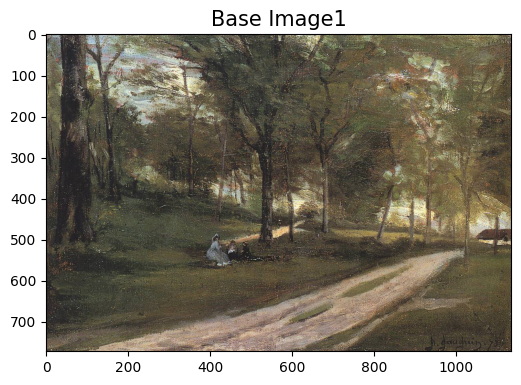

In [10]:
plt.figure()
plt.title("Base Image1",fontsize=15)
img1 = load_img(content_path1)
plt.imshow(img1)

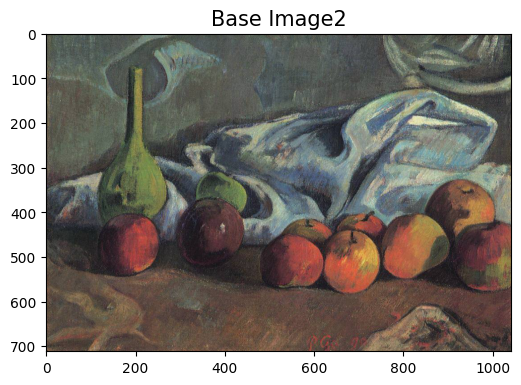

In [11]:
plt.figure()
plt.title("Base Image2",fontsize=15)
img1 = load_img(content_path2)
plt.imshow(img1)

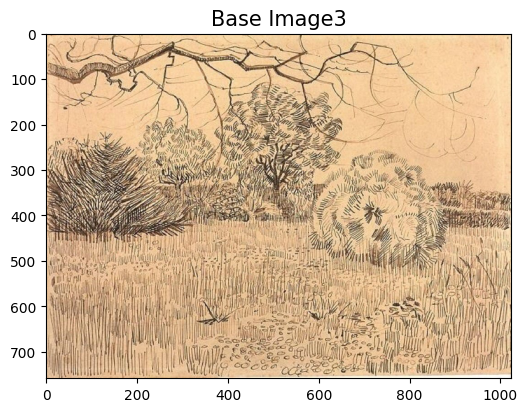

In [12]:
plt.figure()
plt.title("Base Image3",fontsize=15)
img1 = load_img(content_path3)
plt.imshow(img1)

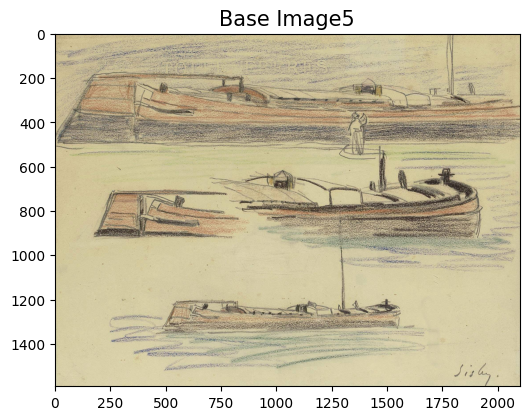

In [14]:
plt.figure()
plt.title("Base Image5",fontsize=15)
img1 = load_img(content_path5)
plt.imshow(img1)

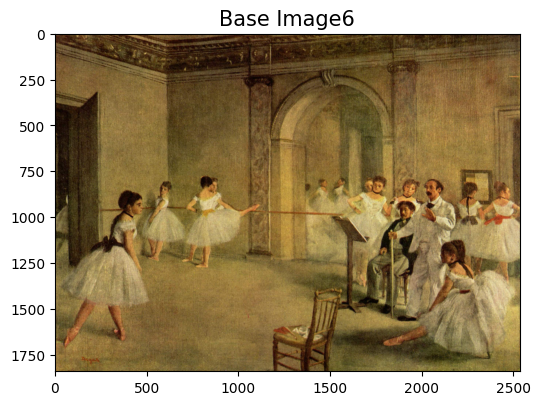

In [15]:
plt.figure()
plt.title("Base Image6",fontsize=15)
img1 = load_img(content_path6)
plt.imshow(img1)

## load style images to see

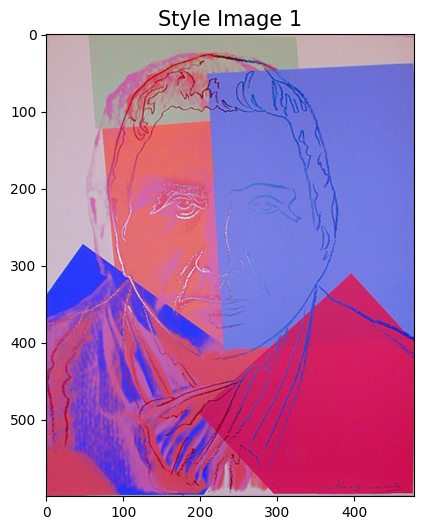

In [16]:
plt.figure()
plt.title("Style Image 1",fontsize=15)
img1 = load_img(style_path1)
plt.imshow(img1)

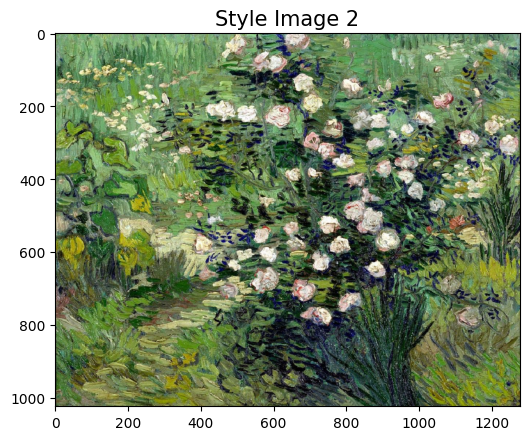

In [17]:
plt.figure()
plt.title("Style Image 2",fontsize=15)
img1 = load_img(style_path2)
plt.imshow(img1)

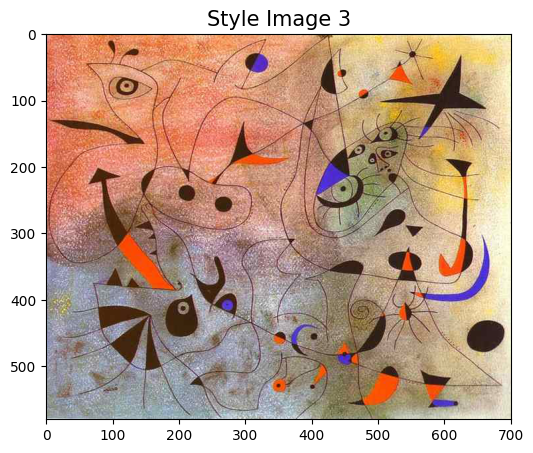

In [18]:
plt.figure()
plt.title("Style Image 3",fontsize=15)
img1 = load_img(style_path3)
plt.imshow(img1)

# Start mixing!

# 1. try tensorflow hub

In [20]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [21]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

## 1.1 content3 + style2

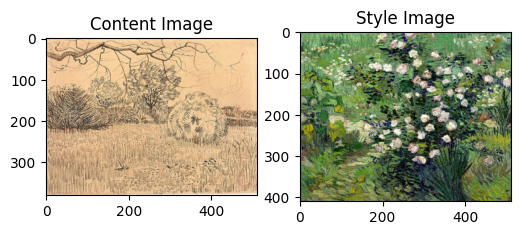

In [22]:
content_image3 = load_img(content_path3)
style_image2 = load_img(style_path2)
plt.subplot(1, 2, 1)
imshow(content_image3, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image2, 'Style Image')

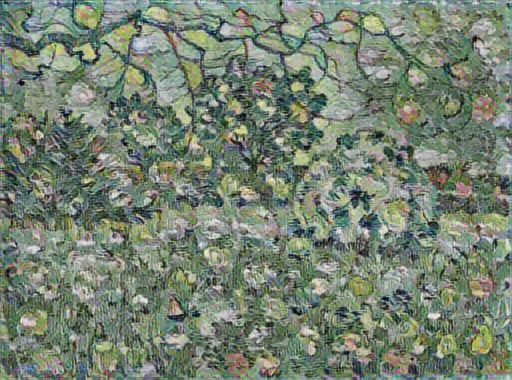

In [23]:
import tensorflow_hub as hub # import model
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2') # load model
stylized_image1 = hub_model(tf.constant(content_image3), tf.constant(style_image2))[0]
tensor_to_image(stylized_image1)

## 1.2 content 1 + style 2

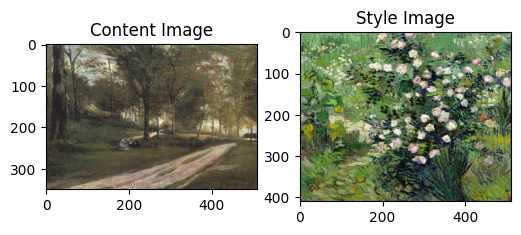

In [24]:
content_image1 = load_img(content_path1)
style_image2 = load_img(style_path2)
plt.subplot(1, 2, 1)
imshow(content_image1, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image2, 'Style Image')

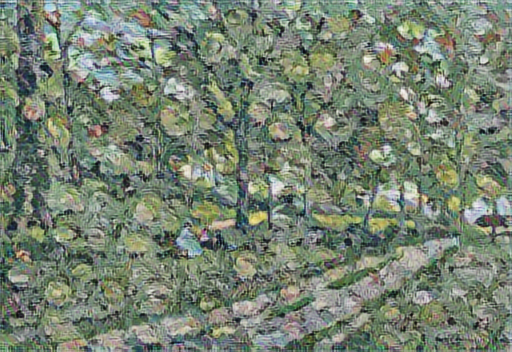

In [25]:
#import tensorflow_hub as hub # import model
#hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2') # load model
stylized_image1 = hub_model(tf.constant(content_image1), tf.constant(style_image2))[0]
tensor_to_image(stylized_image1)

## 1.3 Style2+Style3

From the mix result of content picture 3 and style picture 2, the result of content picture 1 and style picture 2, the insluence of result picture from style picture  2 is very strong. So I wonder, if I use style picture 2 as content and choose a picture which has very different style with style picture 2, what will happen? Then I tried in the following code.

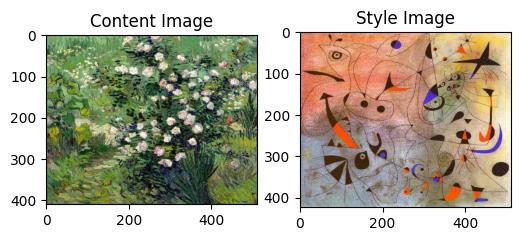

In [26]:
content_image2a = load_img(style_path2)
style_image3 = load_img(style_path3)
plt.subplot(1, 2, 1)
imshow(content_image2a, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image3, 'Style Image')

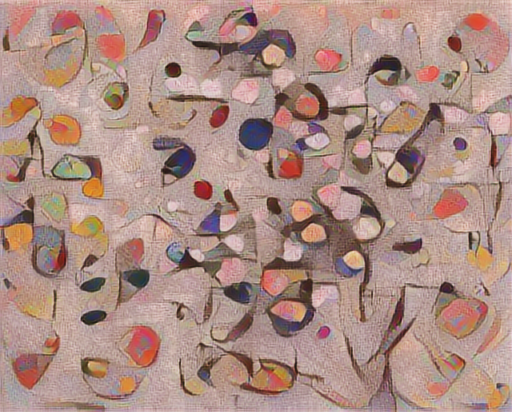

In [27]:
stylized_image1 = hub_model(tf.constant(content_image2a), tf.constant(style_image3))[0]
tensor_to_image(stylized_image1)

## 1.4 content 2 +style 1

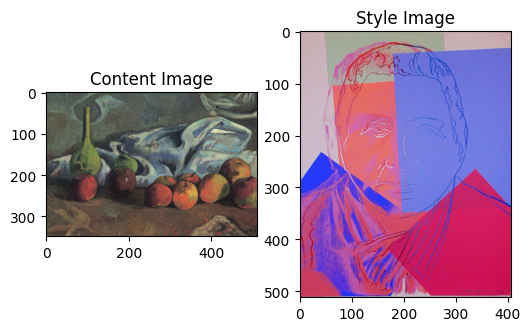

In [28]:
content_image2 = load_img(content_path2)
style_image1 = load_img(style_path1)
plt.subplot(1, 2, 1)
imshow(content_image2, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image1, 'Style Image')

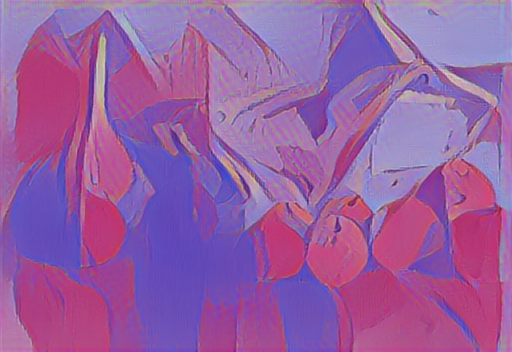

In [29]:
stylized_image1 = hub_model(tf.constant(content_image2), tf.constant(style_image1))[0]
tensor_to_image(stylized_image1)

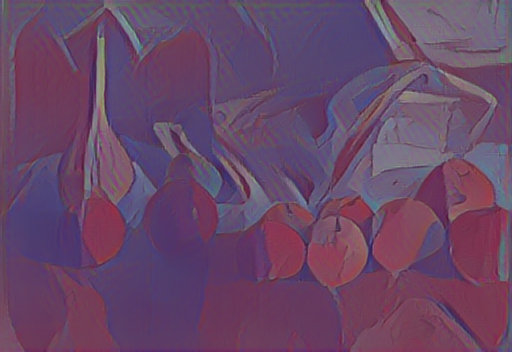

In [30]:
stylized_image1 = hub_model(tf.constant(content_image2), tf.constant(style_image1)*0.5)[0]
tensor_to_image(stylized_image1)

### Finding 1：
One surprising finding is I found that by doing some math in the weight of content and style picture, the value or influence of them on mixed result will change. So I can adjust pictures by change their weight.

### Another question is : 
how the style of content picture will influence the outcome? I did more experiments.

### content3+style2  vs  content 5 +style2 vs content 6 + style 2

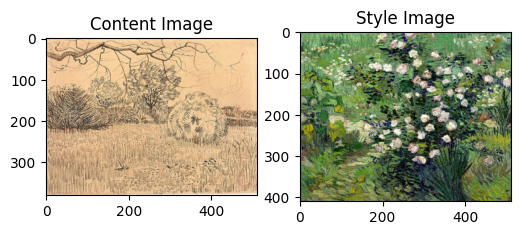

In [31]:
content_image3 = load_img(content_path3)
style_image2 = load_img(style_path2)
plt.subplot(1, 2, 1)
imshow(content_image3, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image2, 'Style Image')

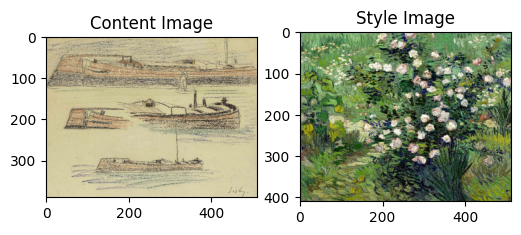

In [32]:
content_image5 = load_img(content_path5)
style_image2 = load_img(style_path2)
plt.subplot(1, 2, 1)
imshow(content_image5, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image2, 'Style Image')

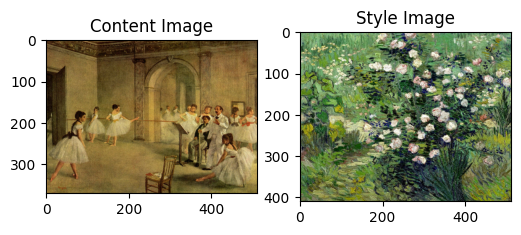

In [33]:
content_image6 = load_img(content_path6)
style_image2 = load_img(style_path2)
plt.subplot(1, 2, 1)
imshow(content_image6, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image2, 'Style Image')

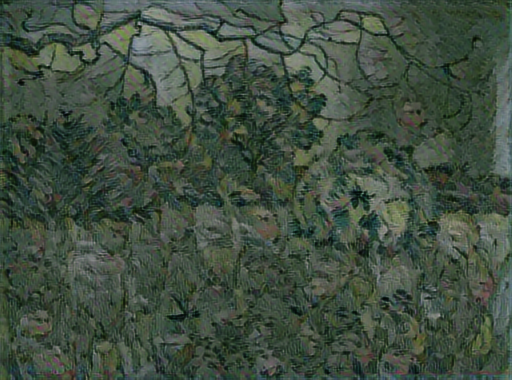

In [34]:
stylized_image1 = hub_model(tf.constant(content_image3), tf.constant(style_image2)*0.3)[0]
tensor_to_image(stylized_image1)

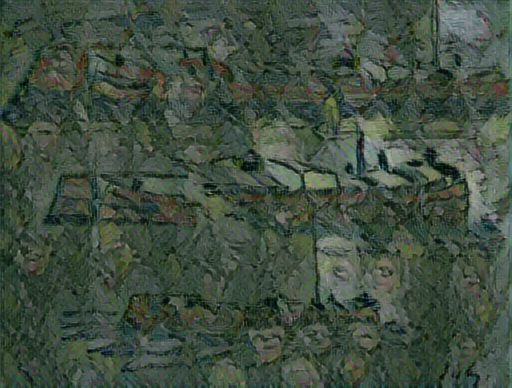

In [35]:
stylized_image2 = hub_model(tf.constant(content_image5), tf.constant(style_image2)*0.3)[0]
tensor_to_image(stylized_image2)

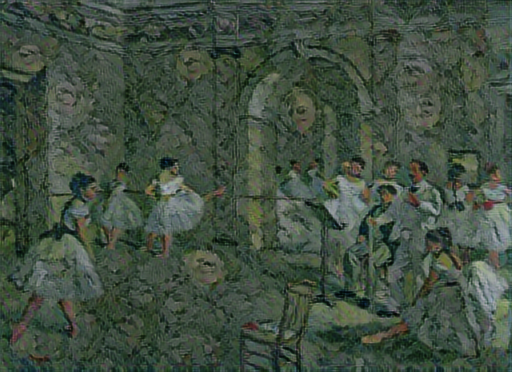

In [36]:
stylized_image2 = hub_model(tf.constant(content_image6), tf.constant(style_image2)*0.3)[0]
tensor_to_image(stylized_image2)

### Finding2:
To make the result better seen, I adjust the weight of style picture into 0.3 and compared the mixed result from content 1, 5, 6 and style 2. From picture after style transfered, I found that the content piccture has more color and stronger style and more content, it will remain more details after style transfered, otherwise, the content will be too less to see. 

#### So, can I do the same thing on VGG model? I think I can try and select some good style picture to adjust and get one satisfied picture.

# 2. Try VGG19

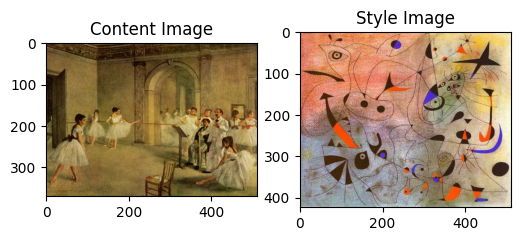

In [37]:
content_image2 = load_img(content_path6)
style_image1 = load_img(style_path3)
plt.subplot(1, 2, 1)
imshow(content_image6, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image3, 'Style Image')

These code from 
https://www.tensorflow.org/tutorials/generative/style_transfer#visualize_the_input

In [38]:
content_image = load_img(content_path6)
style_image = load_img (style_path3)

x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [39]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('vestment', 0.6459174),
 ('altar', 0.26400268),
 ('monastery', 0.014165268),
 ('vault', 0.013529297),
 ('groom', 0.008685198)]

In [40]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
#vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
print()
for layer in vgg.layers:
  print(layer.name)


input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [41]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

## Build model

In [42]:
def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [43]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image1*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 424, 512, 64)
  min:  0.0
  max:  814.09424
  mean:  34.83379

block2_conv1
  shape:  (1, 212, 256, 128)
  min:  0.0
  max:  4233.1104
  mean:  179.06793

block3_conv1
  shape:  (1, 106, 128, 256)
  min:  0.0
  max:  10184.514
  mean:  168.70331

block4_conv1
  shape:  (1, 53, 64, 512)
  min:  0.0
  max:  22468.285
  mean:  696.65015

block5_conv1
  shape:  (1, 26, 32, 512)
  min:  0.0
  max:  4537.6353
  mean:  59.764275



## Calculate style¶

In [44]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [45]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [46]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0
    max:  10139.877
    mean:  322.1849

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  62434.21
    mean:  10732.908

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  194314.39
    mean:  9355.736

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  4358904.5
    mean:  173613.38

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  97835.9
    mean:  1520.1884

Contents:
   block5_conv2
    shape:  (1, 23, 32, 512)
    min:  0.0
    max:  1278.2947
    mean:  15.440152


## Gradient descent
code from:
https://www.tensorflow.org/tutorials/generative/style_transfer

In [47]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [48]:
image = tf.Variable(content_image)

In [49]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [50]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [51]:
style_weight=0.08
content_weight=0.05

In [52]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [53]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [54]:
type(image)

tensorflow.python.ops.resource_variable_ops.ResourceVariable

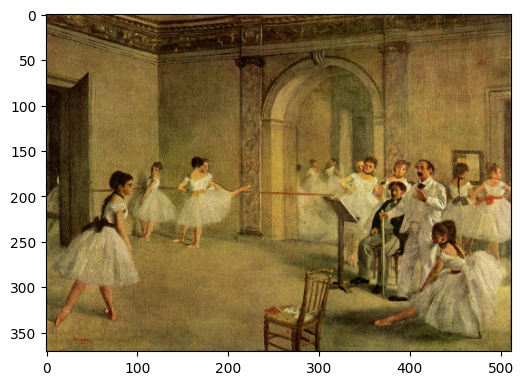

In [55]:
plt.imshow(image.numpy()[0])

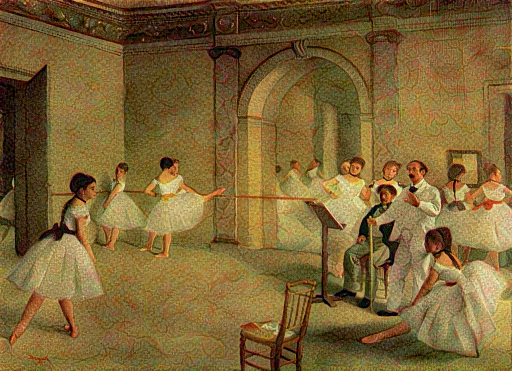

In [56]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

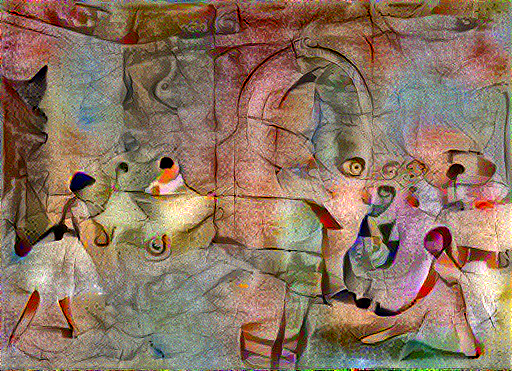

Train step: 300
Total time: 325.4


In [57]:
import time
start = time.time()

out_freq = 10
img_list = [] 

epochs = 10
steps_per_epoch = 30

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
    
    if (step % out_freq == 0):
        img_list.append(image.numpy())
        
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [58]:
import os
os.chdir("./outcome")

## this file can generate video，but the file is too large to upload to github

In [70]:
# video generation cell, save img on the run
#import matplotlib.pyplot as plt
#import matplotlib.animation as  animation
#from IPython.display import HTML

#matplotlib.rcParams['savefig.pad_inches'] = 0

#fig, ax = plt.subplots()

#def update(num):
    #ax.imshow(img_list[num][0])
    
   # ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
#
   # plt.autoscale(tight=True)
  #  plt.tight_layout()
    
   # plt.savefig('outcome_' + str(num) + '.png')
    
#ani = animation.FuncAnimation(fig, update, frames=range(len(img_list)))
#HTML(ani.to_jshtml())